# Installing the Tensorflow object detection API

pip install tensorflow==2.4.1
pip install Cython
pip install contextlib2
pip install pillow
pip install lxml
pip install jupyter
pip install matplotlib
pip install tf_slim
pip install opencv-python
pip install tf_slim

3) Download the files from this repository

4) Copy and paste protoc.exe file in the path models-master\research

5) Open the Commmand Prompt in models-master\research and copy and run the command included in protoc command.txt

6) Copy the files object_detection_tutorial.ipynb, 1.0 Customized Object Detection.ipynb & 1.1 Customized Object Detection-Video.ipynb into models-master\research

7) Run above codes and check


## # Get tensorflow/models or cd to parent directory of the repository:


In [1]:
import numpy as np
import os 
import six.moves.urllib as urllib # six.moves is a module provides a modules under a general name for both python2&3  
# it help us to write the code that is compatible with python2&3, urllib to get content from web, from six.moves it import
# the mixture of urllib,urllib2,urlparse with python2

import sys # in-built sys module to use system-specific attributes and functions
import tarfile # to read & write tar archive files using gzip,bz2,lzma compression. zipfile module will read & write zip files
import tensorflow as tf
import zipfile  
import pathlib # its a module related to path handling operations

from collections import defaultdict#same as dictionary but never raises keyError in this so called collection module of defaultdict
# which is container like dictionary returns dict -like object. it gives default value for dict if not keyError for absent value.
from io import StringIO # in-memory file-like object. it is used as input or output to the function that expect a standard file object
# when the Stringio is created it is initialized by passing string to the constructor.simply means giving a string and making as file object
from matplotlib import pyplot as plt
from PIL import Image # python imaging library gives image editing capabilites and Image is a module to represent PIL image. they do sort of 
# operations like to load images, create images and also provide factory functions.its a lazy operation it opens the data but not read until 
# you try to do or process the image by call the load()method. basic opencv in python shortly assume it in such a way.
from IPython.display import display


In [2]:
# Import Object detection Modules
from object_detection.utils import ops as utils_ops   #  Reframe the bbox mask to the image size.
from object_detection.utils import label_map_util    # to map the labels
from object_detection.utils import visualization_utils as vis_util # to display visulal boxes

# reframe_box_masks_to_image_masks
# create_category_index_from_labelmap
# visualize_boxes_and_labels_on_image_array

In [3]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile


## Model preparation

# Variables
Any model exported using the export_inference_graph.py tool can be loaded here simply by changing the path.

By default we use an "SSD with Mobilenet" model here. See the detection model zoo for a list of other models that can be run out-of-the-box with varying speeds and accuracies.



## Loader

In [4]:
def load_model(model_name):
    
    base_url = 'http://download.tensorflow.org/models/object_detection/'
    model_file = model_name + '.tar.gz'  # file format exists-in, so add extension
    model_dir = tf.keras.utils.get_file(
        fname=model_name,               # fname represents model_name
        origin=base_url+model_file,
        untar=True)
    
    model_dir = pathlib.Path(model_dir)/"saved_model" # path orgainising
    
    model = tf.saved_model.load(str(model_dir))
    model = model.signatures['serving_default']
    
    return model 

### Path to labels and Loading label map:
Label maps map indices to category names, so that when our convolution network predicts 5, we know that this corresponds to airplane. Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine



In [5]:
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,use_display_name=True)

In [6]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/test_images')
TEST_IMAGES_PATH = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob('*.jpg'))) #glob mean globally use jpg extension for all images in directory
TEST_IMAGES_PATH

[WindowsPath('object_detection/test_images/image1.jpg'),
 WindowsPath('object_detection/test_images/image2.jpg'),
 WindowsPath('object_detection/test_images/image3.jpg')]

# Detection

Load an object detection model:



In [7]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [8]:
print(detection_model.inputs) # Observe carefully the image input could be any shape

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


In [9]:
detection_model.output_dtypes # but return output in tf.float32 dtype

{'detection_boxes': tf.float32,
 'detection_scores': tf.float32,
 'detection_classes': tf.float32,
 'num_detections': tf.float32}

In [10]:
detection_model.output_shapes

{'detection_boxes': TensorShape([None, 100, 4]),
 'detection_scores': TensorShape([None, 100]),
 'detection_classes': TensorShape([None, 100]),
 'num_detections': TensorShape([None])}

In [14]:
def run_inference_for_single_image(model, image):
    image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
    output_dict = model(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
    if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
        output_dict['detection_masks'], output_dict['detection_boxes'],
        image.shape[0], image.shape[1])      
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
    return output_dict


In [21]:
def show_inference(model, image_path):
    
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
    image_np = np.array(Image.open(image_path))
  # Actual detection.
    output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=3,min_score_thresh=0.5)

    display(Image.fromarray(image_np))


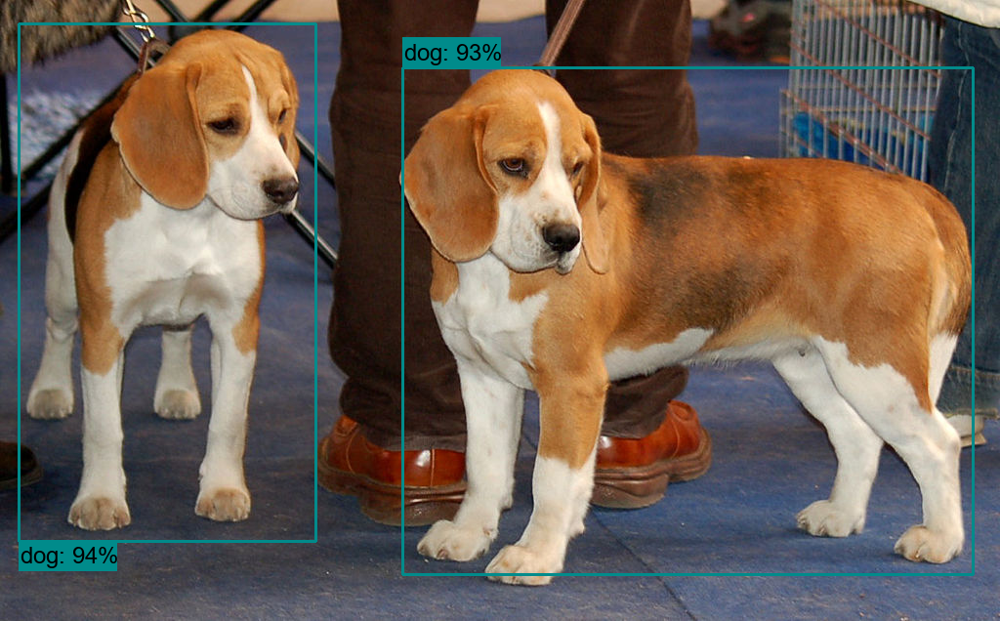

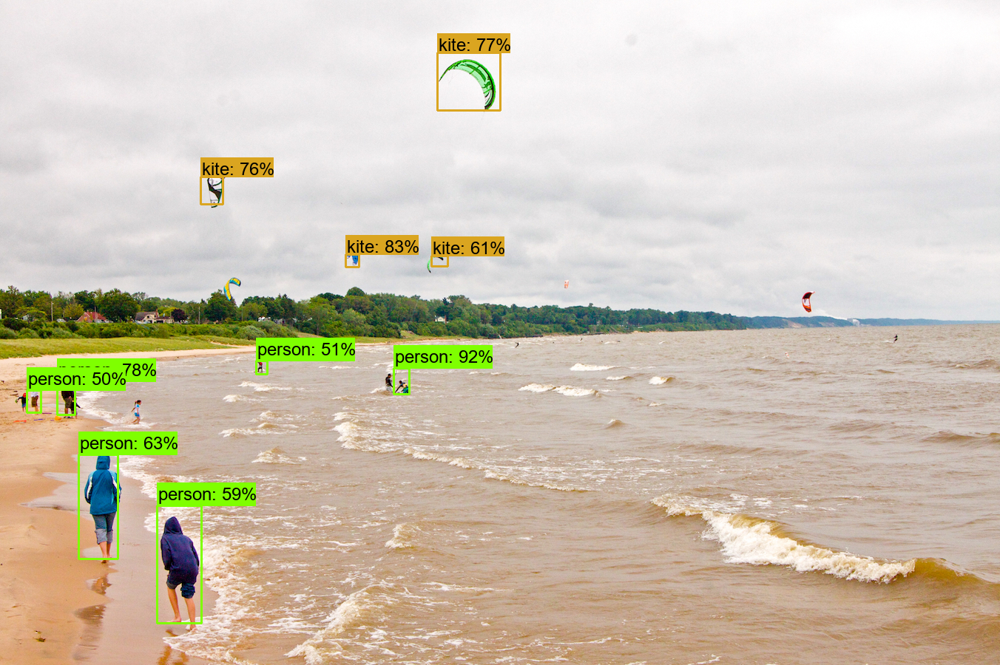

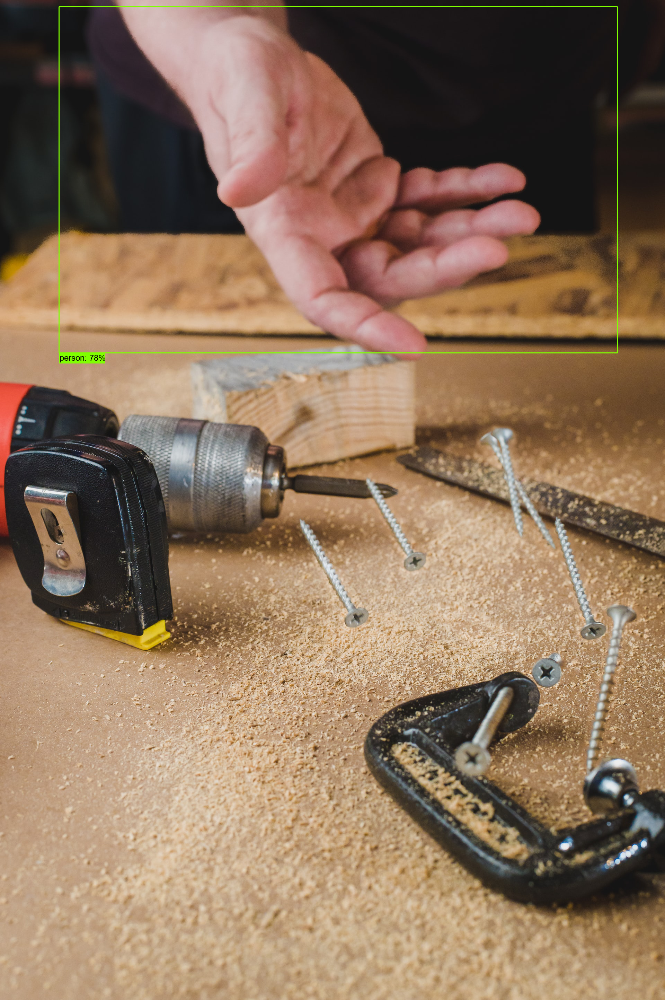

In [22]:
for image_path in TEST_IMAGES_PATH:
    show_inference(detection_model, image_path)